In [1]:
#Importing some libraries
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colors
import numpy as np
import seaborn as sns
import pandas_profiling as pp
import scipy
from scipy import stats
from pylab import rcParams

In [3]:
#Importing our data
df = pd.read_csv('Food_Production.csv')

In [7]:
#Getting a first look at our dataset
print(df.shape)

(43, 23)


In [8]:
df.head()

,Food product,Land use change,Animal Feed,Farm,Processing,Transport,Packging,Retail,Total_emissions,Eutrophying emissions per 1000kcal (gPO₄eq per 1000kcal),...,Freshwater withdrawals per 100g protein (liters per 100g protein),Freshwater withdrawals per kilogram (liters per kilogram),Greenhouse gas emissions per 1000kcal (kgCO₂eq per 1000kcal),Greenhouse gas emissions per 100g protein (kgCO₂eq per 100g protein),Land use per 1000kcal (m² per 1000kcal),Land use per kilogram (m² per kilogram),Land use per 100g protein (m² per 100g protein),Scarcity-weighted water use per kilogram (liters per kilogram),Scarcity-weighted water use per 100g protein (liters per 100g protein),Scarcity-weighted water use per 1000kcal (liters per 1000 kilocalories)
0,Wheat & Rye (Bread),0.1,0.0,0.8,0.2,0.1,0.1,0.1,1.4,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Maize (Meal),0.3,0.0,0.5,0.1,0.1,0.1,0.0,1.1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Barley (Beer),0.0,0.0,0.2,0.1,0.0,0.5,0.3,1.1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Oatmeal,0.0,0.0,1.4,0.0,0.1,0.1,0.0,1.6,4.281357,...,371.076923,482.4,0.945482,1.907692,2.897446,7.6,5.846154,18786.2,14450.92308,7162.104461
4,Rice,0.0,0.0,3.6,0.1,0.1,0.1,0.1,4.0,9.514379,...,3166.760563,2248.4,1.207271,6.267606,0.759631,2.8,3.943662,49576.3,69825.77465,13449.891480


Describe what the variables mean in the dataset:

In the case of my data there will be more than 5 variables in order to analyze the impact of agriculture on carbon emissions. 

First when we look at the rows in our data frame we see 43 of the most common agriculture products grown across the globe. We have 23 columns which show the respective land, water usage and carbon footprints. 

For example when looking at the first 7 columns we are given:


   1. Land use change - Kg CO2 - equivalents per kg product
   2. Animal Feed - Kg CO2 - equivalents per kg product
   3. Farm - Kg CO2 - equivalents per kg product
   4. Processing - Kg CO2 - equivalents per kg product
   5. Transport - Kg CO2 - equivalents per kg product
   6. Packaging - Kg CO2 - equivalents per kg product
   7. Retail - Kg CO2 - equivalents per kg product
   
When looking at Wheat & Rye (Bread) we see that for every kilogram of product produced, there is a .1 kg of CO2 produced in the land use change category. 

The next column to look at is Total_emissions. This column gives us the total amount of KG of C02 produced in the entire production from growth to distribution at the market level. For Wheat & Rye we see that for every kg of product we produce 1.4 kg of CO2.

The next columns do carry quite a bit of NaN (missing) values, but can carry some interesting information. The Eutrophying emissions category tells us the amount of pollutions which are caused by the production of the agricultural products. Eutrophication is when bodies of water exhibit excess nutrients which in turn kill of oxygen and life in that respective ecosystem. Agricultural production is one of the leading contributors for eutrophication. 




In [10]:
#Now lets take a broad look at our data
profile = pp.ProfileReport(df, title='Pandas Profiling Report', explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/36 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
#Exporting the profile report to a file:
profile.to_file("Pandas Profiling Report - FoodProduction.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

The Pandas Profiling package allows us to generate advanced statistics of our dataset without the use of other codes but for the sake of this study I will get a closer look at some of our variables. This is helpful to get a close look at the data very quickly, but is not great at demonstrating the use of code to find these things out for myself. In this case I will look further into individual variables to gain information. 


Histograms:

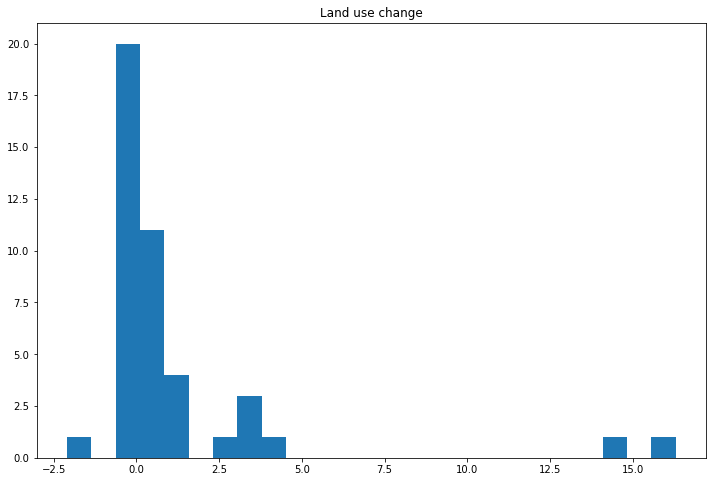

In [16]:
#Land Use Histogram

land_use_hist = df.hist(column='Land use change', bins=25, grid=False, figsize=(12,8))

We have a mean of 1.26, Max of 16.3, and minimum value of -2.1. We have quite a few zeros, or crops which produce no emissions based on the change of land use. This variable is skewed towards the left. There are a few agricultural products which produce around 15 kg of CO2 per kg of product. This will be important to look at later. 

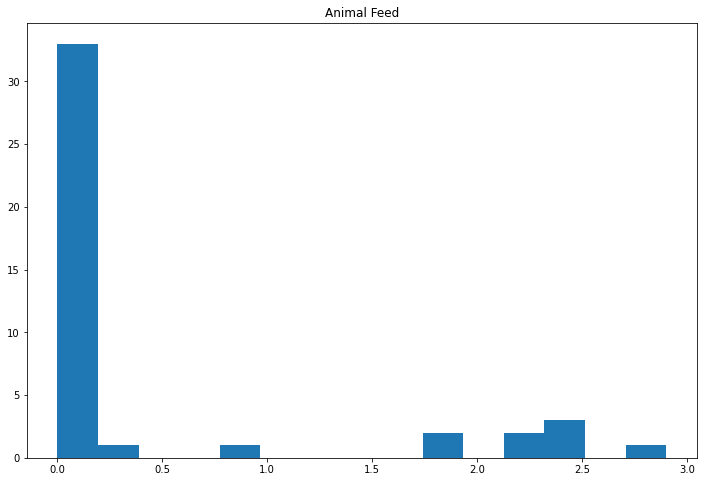

In [20]:
#Animal Feed Histogram
animal_feed_hist = df.hist(column='Animal Feed', bins=15, grid=False, figsize=(12,8))

We have a mean of 0.453, a minimum of 0 and a maximum of 2.9. There are 33 zero values which make sense for products which are produce based as opposed of animal products (beef,poultry,dairy, etc.). 

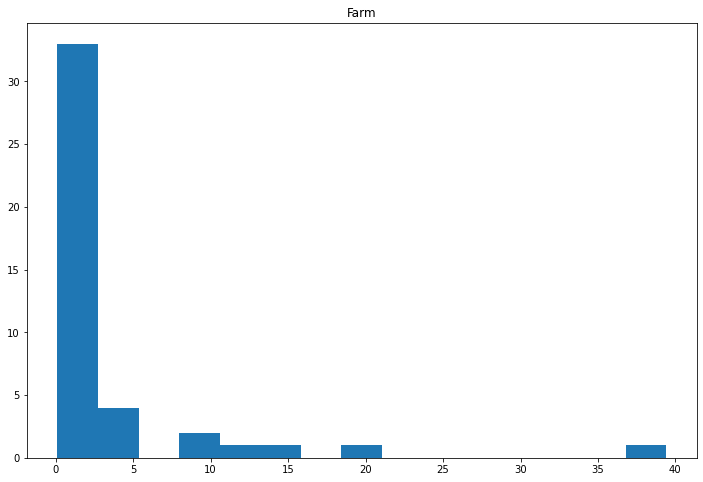

In [21]:
#Farming Histogram
farming_hist = df.hist(column='Farm', bins=15, grid=False, figsize=(12,8))

We have a mean of 3.47, min of 0.1 and a max of 39.4. The 39.4 value comes from Beef farming, which costs a lot of resources to produce a kg of beef product. 

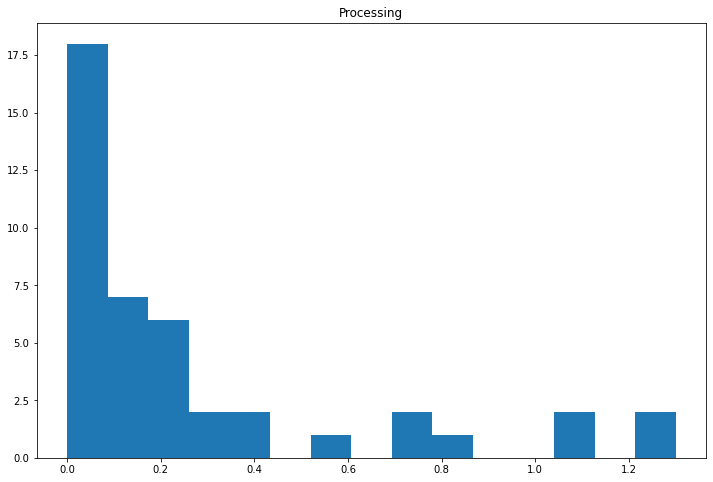

In [22]:
#Processing Hist
processing_hist = df.hist(column='Processing', bins=15, grid=False, figsize=(12,8))

We have a mean of .25 and max of 1.3 and a minimum of 0 with 18 zeros. 

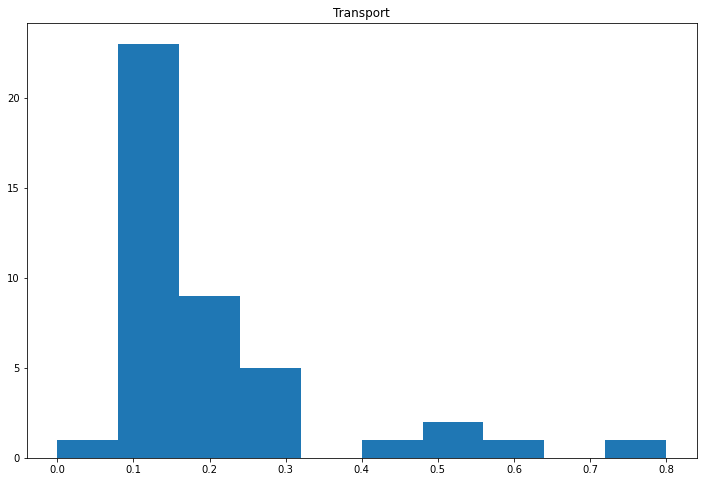

In [26]:
#Transport hist
transport_hist = df.hist(column='Transport', bins=10, grid=False, figsize=(12,8))

Transport is similar to the other histograms with a mean value of .27 and min of 0 and a max of 1.6.

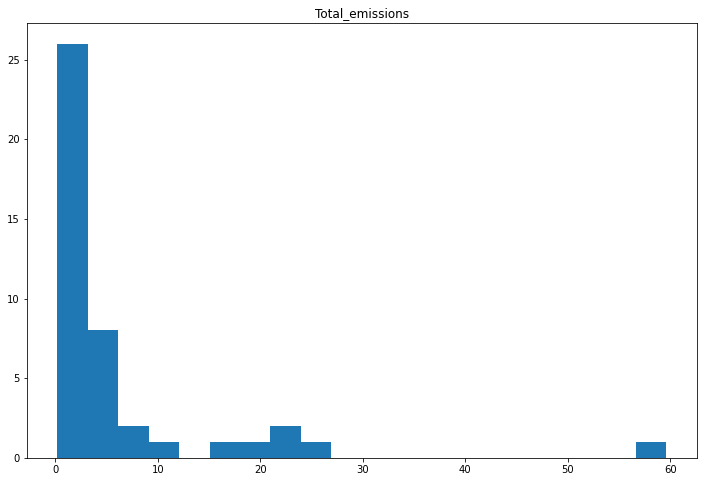

In [29]:
#Total_Emissions Hist
total_hist= df.hist(column='Total_emissions', bins=20, grid=False, figsize=(12,8))

This is the most important Histogram from our dataset as it gives us the emissions of all foods for every part of their life cylce. We see that our minimum value is 0.2 and our maximum value is 59.6. Our mean value is 5.97 which tells us on average 1kg of food product produced 5.97 kg of CO2. 

Probability Mass Function:
    
For my Probability mass function I am going to be comparing the total emissions between Animal Products and Vegetable Products. 

In [32]:
import thinkstats2
import thinkplot

#Subsetting by product type

veg_df = df[:33]
animal_df = df[-10:]

In [35]:
veg_pmf = thinkstats2.Pmf(veg_df.Total_emissions, label = 'Non-Animal Product')
animal_pmf = thinkstats2.Pmf(animal_df.Total_emissions, label = 'Animal Product')

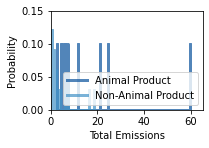

<Figure size 576x432 with 0 Axes>

In [41]:
thinkplot.PrePlot(2)
thinkplot.SubPlot(2, 2, 2)
thinkplot.Pmfs([animal_pmf, veg_pmf])
thinkplot.Show(xlabel='Total Emissions',
               ylabel= 'Probability',
              axis = [0,65,0,.15])       

Here is the distribution of probabilities of total emissions based on the type of agricultural product. This is interesting to look at because we can see that animal products have a higher probability of producing more emissions compared to non-animal products. 

Cumulative Distribution Function

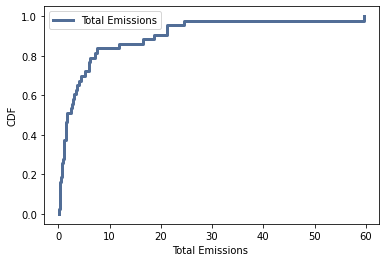

<Figure size 576x432 with 0 Axes>

In [42]:
cdf = thinkstats2.Cdf(df.Total_emissions, label = 'Total Emissions')
thinkplot.Cdf(cdf)
thinkplot.Show(xlabel = 'Total Emissions ',
              ylabel = 'CDF' )

The Shape of our distribution of Percentiles shows that the more emissions produced, the higher the percentile the product will land in. About 82% of products produce below around 6 kg of CO2 per kg of product. We can see that 90% of products produce below 20 kg of CO2 per kg of product. 

Analytical Distribution: Complementary Cumulative Distribution Function

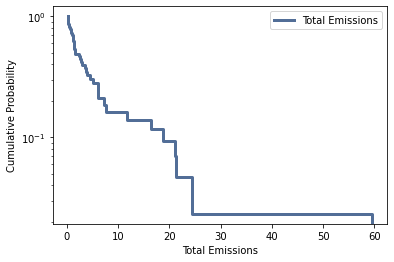

<Figure size 576x432 with 0 Axes>

In [44]:
thinkplot.Cdf(cdf,complement=True)
thinkplot.Show(xlabel='Total Emissions',
              ylabel='Cumulative Probability',
              yscale='log')

So the CCDF values are equal to 1-CDF values. This shows us the peak values of our distribution of Total Emissions. At any point in this graph it shows the percentage it is at or above that value. The CCDF curve moves towards the right so that Total emissions ratio increases which means that it shows the percentage of products which reach a certain threshold for emissions produced. 

Comparing Variables:

#Comparing Farm (CO2 spent growing the product) with total emissions

No handles with labels found to put in legend.


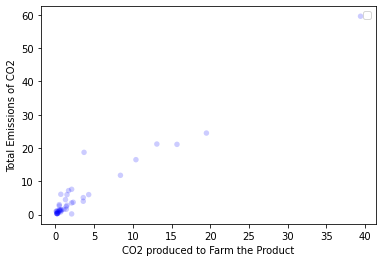

<Figure size 576x432 with 0 Axes>

In [47]:
thinkplot.scatter(df.Farm, df.Total_emissions)
thinkplot.show(xlabel = 'CO2 produced to Farm the Product', 
              ylabel= 'Total Emissions of CO2')

In [48]:
Total_emissions=df['Total_emissions']
Farm=df['Farm']
stats.pearsonr_coefficient, ptsefgp_value=stats.pearsonr(Farm,Total_emissions)
print ('PearsonR Correlation Coefficient %0.3f' % (stats.pearsonr_coefficient))

PearsonR Correlation Coefficient 0.969


There is a strong correlations between the farming process of products with the total emissions produced by our products. We see that there is a 96.9% correlation between the 2 variables. The relationship seems linear but without enough points on our plot, we cannot really tell. 

Now I will do another for Total Emissions and Packaging

No handles with labels found to put in legend.


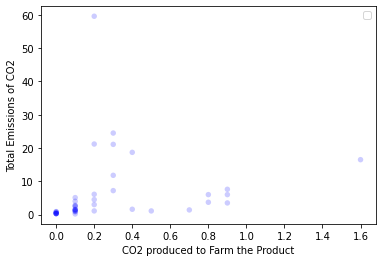

<Figure size 576x432 with 0 Axes>

In [50]:
thinkplot.scatter(df.Packging, df.Total_emissions)
thinkplot.show(xlabel = 'CO2 produced to Package the Product', 
              ylabel= 'Total Emissions of CO2')

In [53]:
Total_emissions=df['Total_emissions']
Packaging=df['Packging']
stats.pearsonr_coefficient, ptsefgp_value=stats.pearsonr(Packaging,Total_emissions)
print ('PearsonR Correlation Coefficient %0.3f' % (stats.pearsonr_coefficient))

PearsonR Correlation Coefficient 0.205


There is not a very strong correlation between packaging and the total emissions produced with a weak correlation of 20.5%. This means that total emissions is only explained for about 20% of the products. 

Hypothesis Testing

Let us Conduct a Spearmans's Rank Hypothesis test on the Relationship between CO2 produced in the farming process and Total Emissions Produced. For our null hypothesis we will say that our two samples are independent.

In [55]:
pvalue = stats.spearmanr(Total_emissions, Farm)
print(pvalue)

SpearmanrResult(correlation=0.8408351290137674, pvalue=1.7169939673087357e-12)


So our P value is <0.05 which means that there is probably dependency between the samples. 

Regression:

For this final step, we will conduct a regression analysis with Total_emissions as our dependent value and Farm, Processing, Transport, Packaging and Retail

In [61]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [62]:
model=smf.ols('Total_emissions~+Farm+Processing+Transport+Packging+Retail',df).fit()

In [63]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        Total_emissions   R-squared:                       0.943
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     123.0
Date:                Thu, 03 Jun 2021   Prob (F-statistic):           5.39e-22
Time:                        13:37:43   Log-Likelihood:                -99.937
No. Observations:                  43   AIC:                             211.9
Df Residuals:                      37   BIC:                             222.4
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.6130      0.768      0.798      0.430      -0.943       2.169
Farm           1.3722      0.084     16.381      0.000       1.202       1.542
Processing     1.4765      1.863      0.793      0.433      -2.298       5.251
Transport     -0.8554      2.811     -0.304      0.763      -6.551       4.840
Packging       1.2375      1.357      0.912      0.368      -1.513       3.988
Retail         0.8178      4.310      0.190      0.851      -7.914       9.550
==============================================================================
Omnibus:                       51.370   Durbin-Watson:                   1.686
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              314.342
Skew:                           2.808   Prob(JB):                     5.52e-69
Kurtosis:                      14.996   Cond. No.                         85.8
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Lets run the same model except without Farm as a variable. 

In [64]:
model1=smf.ols('Total_emissions~Processing+Transport+Packging+Retail',df).fit()

In [65]:
model1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        Total_emissions   R-squared:                       0.532
Model:                            OLS   Adj. R-squared:                  0.482
Method:                 Least Squares   F-statistic:                     10.79
Date:                Thu, 03 Jun 2021   Prob (F-statistic):           6.09e-06
Time:                        13:39:02   Log-Likelihood:                -145.31
No. Observations:                  43   AIC:                             300.6
Df Residuals:                      38   BIC:                             309.4
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.0856      2.175      0.499      0.621      -3.317       5.488
Processing    20.2856      4.157      4.880      0.000      11.870      28.701
Transport     -0.7551      7.968     -0.095      0.925     -16.885      15.374
Packging      -2.4814      3.793     -0.654      0.517     -10.160       5.198
Retail         8.0451     12.152      0.662      0.512     -16.555      32.645
==============================================================================
Omnibus:                       31.757   Durbin-Watson:                   1.366
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              126.678
Skew:                           1.597   Prob(JB):                     3.11e-28
Kurtosis:                      10.778   Cond. No.                         12.0
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

The R2 value of 94.3 percent and the adjusted R2 value of 93.6% tell us that our first model fits the data very well. An F statistic of 123 with a very low probability tells us that we can reject the null for our first model that a intercept only model will be a better fit then our regression and that there is a relationship with these variables and Total Emissions. Of our predictor varaibles we see that only farm has a value of <0.05 which means that it is a significant variable in determining the total emissions. Comparing it to the second model summary results we see that when farming is taking out of the equation, the correlation and adjusted correlation drops by around 40% and we have a very low F statistic. We can conclude that the farming process of a product in the agricultural life cycle from beginning to end is the most impactful stage of CO2 production. 